In [119]:
import numpy as np
from numpy.typing import NDArray
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime
import os
import importlib
import qlbmlib
importlib.reload(qlbmlib)

<module 'qlbmlib' from '/home/tavaa/research/qlbm/qlbmlib.py'>

## Configuration

In [120]:
# Lattice configuration - 1D
GRID_SIZE = 32
NUM_ITERATIONS = 150

# D1Q3 lattice velocities (1D: left, stationary, right)
links = [[-1], [0], [1]]
weights = [1/6, 2/3, 1/6]
num_velocities = len(links)
speed_of_sound = 1/np.sqrt(3)

print(f"Grid size: {GRID_SIZE}")
print(f"Number of velocities: {num_velocities}")
print(f"Iterations: {NUM_ITERATIONS}")

Grid size: 32
Number of velocities: 3
Iterations: 150


## Initial Conditions

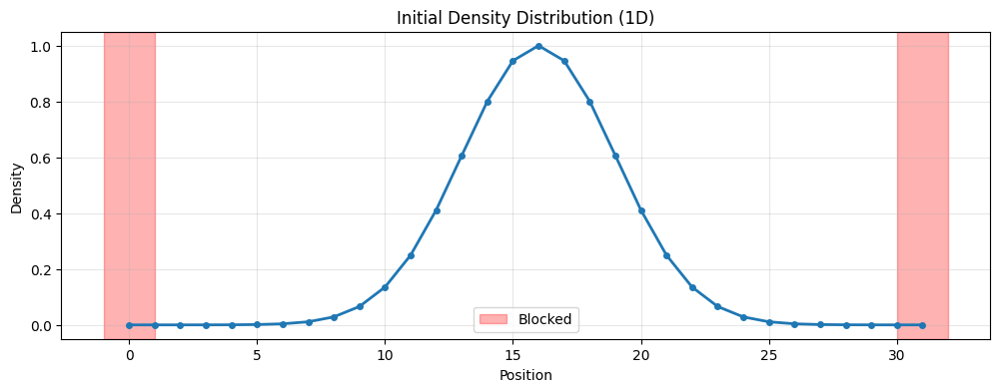

Initial density - Min: 0.00, Max: 1.00


In [121]:
def get_gaussian_distribution_1d(size: int, 
                                center: float = None,
                                sigma: float = 3.0,
                                amplitude: float = 1.0,
                                background: float = 0.0) -> NDArray[np.float64]:
    """Create a 1D Gaussian initial distribution.
    
    Args:
        size: Size of the 1D grid
        center: Center of the Gaussian (defaults to grid center)
        sigma: Standard deviation of the Gaussian
        amplitude: Peak amplitude
        background: Background density value
    """
    if center is None:
        center = size / 2
    
    x = np.arange(size)
    density = background + amplitude * np.exp(-(x - center)**2 / (2 * sigma**2))
    
    # Set boundary sites (blocked) to zero
    density[0] = 0.0
    density[-1] = 0.0
    
    return density

# Create initial distribution
initial_density = get_gaussian_distribution_1d(GRID_SIZE, sigma=3.0, amplitude=1.0, background=0.0)

# Visualize
plt.figure(figsize=(12, 4))
plt.plot(initial_density, linewidth=2, marker='o', markersize=4)
plt.xlabel('Position')
plt.ylabel('Density')
plt.title('Initial Density Distribution (1D)')
plt.grid(True, alpha=0.3)
# Mark blocked sites (walls at 0 and 31, adjacent to fluid sites 1 and 30)
plt.axvspan(-1, 1, color='r', alpha=0.3, label='Blocked')
plt.axvspan(GRID_SIZE-2, GRID_SIZE, color='r', alpha=0.3)
plt.legend()
plt.show()

print(f"Initial density - Min: {initial_density.min():.2f}, Max: {initial_density.max():.2f}")

## Velocity Field

In [122]:
# Constant rightward velocity field
velocity_field = np.ones((1, GRID_SIZE)) * 0.1  # Velocity of 0.1 to the right

print(f"Velocity field shape: {velocity_field.shape}")
print(f"Velocity magnitude: {velocity_field[0, 0]:.2f}")

Velocity field shape: (1, 32)
Velocity magnitude: 0.10


## Boundary Condition Helpers

In [123]:
def create_identity_bc_1d(grid_size: int, num_velocities: int) -> NDArray[np.float64]:
    """Create identity boundary conditions (no transformation) for 1D."""
    bc = np.zeros((grid_size, num_velocities, num_velocities))
    for i in range(grid_size):
        bc[i] = np.eye(num_velocities)
    return bc

def create_bounceback_bc_1d(grid_size: int, 
                            links: list[list[int]]) -> NDArray[np.float64]:
    """Create bounce-back boundary conditions for 1D.
    
    Positions 0 and grid_size-1 are solid walls (always zero density).
    Bounce-back is applied at positions 1 and grid_size-2 (fluid sites next to walls):
    - At position 1 (next to left wall): left-moving particles bounce to right-moving
    - At position grid_size-2 (next to right wall): right-moving particles bounce to left-moving
    
    Args:
        grid_size: Size of the 1D grid
        links: List of velocity vectors (should be [[-1], [0], [1]] for D1Q3)
    """
    num_velocities = len(links)
    bc = create_identity_bc_1d(grid_size, num_velocities)
    
    # Find velocity indices
    left_idx = None
    stationary_idx = None
    right_idx = None
    
    for i, link in enumerate(links):
        if link[0] == -1:
            left_idx = i
        elif link[0] == 0:
            stationary_idx = i
        elif link[0] == 1:
            right_idx = i
    
    print(f"Velocity indices: left={left_idx}, stationary={stationary_idx}, right={right_idx}")
    
    # Position 1 (next to left wall): bounce back left-moving particles
    # Split 50/50 between opposite direction and stationary
    bc[1] = np.zeros((num_velocities, num_velocities))
    bc[1][left_idx, left_idx] = 0.0          # No particles moving left (they bounce)
    bc[1][stationary_idx, stationary_idx] = 1.0  # Stationary stays stationary
    bc[1][right_idx, right_idx] = 1.0        # Right-moving particles pass through
    bc[1][stationary_idx, left_idx] = 1.0    # 100% of left-moving becomes stationary
    
    # Position grid_size-2 (next to right wall): bounce back right-moving particles
    # Split 50/50 between opposite direction and stationary
    bc[-2] = np.zeros((num_velocities, num_velocities))
    bc[-2][left_idx, left_idx] = 1.0         # Left-moving particles pass through
    bc[-2][stationary_idx, stationary_idx] = 1.0  # Stationary stays stationary
    bc[-2][right_idx, right_idx] = 0.0       # No particles moving right (they bounce)
    bc[-2][stationary_idx, right_idx] = 1.0  # 100% of right-moving becomes stationary
    
    return bc

print("Boundary condition helper functions defined (1D)")

Boundary condition helper functions defined (1D)


## Test 3: Bounce-Back

In [124]:
# Create bounce-back BC with velocity field switch at iteration 75
bc_bounceback_switch = create_bounceback_bc_1d(GRID_SIZE, links)

# First 75 iterations with rightward velocity
velocity_field_right = np.ones((1, GRID_SIZE)) * 0.1

# After that, zero velocity
velocity_field_zero = np.zeros((1, GRID_SIZE))

# Setup configuration with two phases
config_bounceback_switch = [
    (75, velocity_field_right, links, weights, speed_of_sound, bc_bounceback_switch),
    (75, velocity_field_zero, links, weights, speed_of_sound, bc_bounceback_switch)
]

# Create output directory
timestamp_switch = datetime.now().strftime("%Y%m%d_%H%M%S")
dirname = f"experiments/BC_BounceBack_VelSwitch_{timestamp_switch}"
os.makedirs(dirname, exist_ok=True)

# Run simulation
output_file = f"{dirname}/simulation.csv"
qlbmlib.simulate_flow_classical(initial_density, config_bounceback_switch, output_file)

print(f"Results saved to {dirname}")
print(f"Phase 1: Iterations 0-75 with velocity = 0.1")
print(f"Phase 2: Iterations 75-150 with velocity = 0.0")

Velocity indices: left=0, stationary=1, right=2
Classical simulation: iterations 0-75/150
Classical Iteration 1/150
Classical Iteration 2/150
Classical Iteration 3/150
Classical Iteration 4/150
Classical Iteration 5/150
Classical Iteration 6/150
Classical Iteration 7/150
Classical Iteration 8/150
Classical Iteration 9/150
Classical Iteration 10/150
Classical Iteration 11/150
Classical Iteration 12/150
Classical Iteration 13/150
Classical Iteration 14/150
Classical Iteration 15/150
Classical Iteration 16/150
Classical Iteration 17/150
Classical Iteration 18/150
Classical Iteration 19/150
Classical Iteration 20/150
Classical Iteration 21/150
Classical Iteration 22/150
Classical Iteration 23/150
Classical Iteration 24/150
Classical Iteration 25/150
Classical Iteration 26/150
Classical Iteration 27/150
Classical Iteration 28/150
Classical Iteration 29/150
Classical Iteration 30/150
Classical Iteration 31/150
Classical Iteration 32/150
Classical Iteration 33/150
Classical Iteration 34/150
C

## Visualization Helper

In [125]:
def visualize_snapshots_1d(filename: str, grid_size: int, 
                          iterations: list[int] = None,
                          title: str = 'Simulation Snapshots') -> None:
    """Visualize 1D simulation snapshots at specified iterations.
    
    Args:
        filename: Path to CSV file containing simulation data
        grid_size: Size of the 1D grid
        iterations: List of iterations to display (defaults to 4 evenly spaced)
        title: Overall title for the figure
    """
    df = pd.read_csv(filename, header=None)
    
    if iterations is None:
        # Select 4 evenly spaced iterations
        n = len(df)
        iterations = [0, n//3, 2*n//3, n-1]
    
    # Get global min and max for consistent y-axis scale
    all_frames = [np.array(df.iloc[i]) for i in iterations]
    vmin = min(frame.min() for frame in all_frames)
    vmax = max(frame.max() for frame in all_frames)
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle(title, fontsize=16)
    
    x = np.arange(grid_size)
    
    for idx, iter_num in enumerate(iterations):
        ax = axes[idx // 2, idx % 2]
        frame_data = np.array(df.iloc[iter_num])
        ax.plot(x, frame_data, linewidth=2, marker='o', markersize=4)
        ax.set_ylim(vmin * 0.9, vmax * 1.1)
        ax.set_xlabel('Position')
        ax.set_ylabel('Density')
        ax.set_title(f'Iteration {iter_num}')
        ax.grid(True, alpha=0.3)
        
        # Mark boundaries as filled spans (walls at 0 and 31, adjacent to fluid sites 1 and 30)
        ax.axvspan(-1, 1, color='r', alpha=0.3, label='Boundary' if idx == 0 else '')
        ax.axvspan(grid_size-2, grid_size, color='r', alpha=0.3)
        if idx == 0:
            ax.legend()
    
    plt.tight_layout()
    plt.show()

In [ ]:
def animate_simulation_1d(filename: str, grid_size: int, 
                         interval: int = 100,
                         title: str = 'Simulation Animation',
                         velocity_configs: list = None):
    """Create an animated plot of the 1D simulation.
    
    Args:
        filename: Path to CSV file containing simulation data
        grid_size: Size of the 1D grid
        interval: Time between frames in milliseconds
        title: Title for the animation
        velocity_configs: List of tuples (start_iter, end_iter, velocity_magnitude) for velocity field visualization
    
    Returns:
        HTML animation object for display in notebook
    """
    from matplotlib.animation import FuncAnimation
    from IPython.display import HTML
    
    df = pd.read_csv(filename, header=None)
    
    # Get global min and max for consistent y-axis scale
    all_data = np.array([df.iloc[i].to_numpy() for i in range(len(df))])
    vmin = all_data.min()
    vmax = all_data.max()
    
    fig, ax = plt.subplots(figsize=(14, 6))
    x = np.arange(grid_size)
    
    # Initialize the line plot
    line, = ax.plot([], [], linewidth=2, marker='o', markersize=4)
    ax.set_xlim(-0.5, grid_size - 0.5)
    ax.set_ylim(vmin * 0.9, vmax * 1.1)
    ax.set_xlabel('Position')
    ax.set_ylabel('Density')
    ax.grid(True, alpha=0.3)
    
    # Mark boundaries (walls at 0 and 31, adjacent to fluid sites 1 and 30)
    ax.axvspan(-1, 1, color='r', alpha=0.3, label='Boundary')
    ax.axvspan(grid_size-2, grid_size-0, color='r', alpha=0.3)
    
    # Initialize velocity field arrows (will be updated in animate)
    quiver = None
    vel_text = None
    
    ax.legend()
    
    # Title with iteration counter
    title_text = ax.set_title(f'{title} - Iteration 0')
    
    def get_velocity_for_iter(frame):
        """Get velocity magnitude for current iteration."""
        if velocity_configs is None:
            return None
        for start, end, vel in velocity_configs:
            if start <= frame < end:
                return vel
        return 0.0
    
    def init():
        line.set_data([], [])
        return line, title_text
    
    def animate(frame):
        nonlocal quiver, vel_text
        
        y = df.iloc[frame].to_numpy()
        line.set_data(x, y)
        title_text.set_text(f'{title} - Iteration {frame}')
        
        # Update velocity field visualization
        if velocity_configs is not None:
            vel = get_velocity_for_iter(frame)
            
            # Remove old quiver and text if they exist
            if quiver is not None:
                quiver.remove()
            if vel_text is not None:
                vel_text.remove()
            
            if vel != 0:
                # Create velocity arrows at a few positions (not too dense)
                arrow_positions = np.arange(2, grid_size-2, 3)  # Every 3rd position
                arrow_x = arrow_positions
                arrow_y = np.full_like(arrow_x, vmax * 0.85, dtype=float)  # Position near top
                
                # Arrow direction and length based on velocity
                u = np.full_like(arrow_x, vel * 10, dtype=float)  # Scale for visibility
                v = np.zeros_like(arrow_x, dtype=float)
                
                quiver = ax.quiver(arrow_x, arrow_y, u, v, 
                                  color='green', alpha=0.7, 
                                  scale=1, scale_units='xy', 
                                  width=0.003, headwidth=4, headlength=5)
                
                vel_text = ax.text(0.98, 0.95, f'v = {vel:.2f}', 
                                  transform=ax.transAxes, 
                                  fontsize=12, color='green',
                                  ha='right', va='top',
                                  bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            else:
                vel_text = ax.text(0.98, 0.95, f'v = 0.00', 
                                  transform=ax.transAxes, 
                                  fontsize=12, color='gray',
                                  ha='right', va='top',
                                  bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
                quiver = None
        
        return line, title_text
    
    anim = FuncAnimation(fig, animate, init_func=init, 
                        frames=len(df), interval=interval, 
                        blit=False, repeat=True)  # Changed blit to False for quiver updates
    
    plt.close()  # Prevent duplicate display
    return HTML(anim.to_jshtml())

print("Animation helper defined (1D)")

Animation helper defined (1D)


## Visualize Results

In [ ]:
# Define velocity configuration for animation
velocity_config = [
    (0, 75, 0.1),    # First phase: velocity = 0.1
    (75, 150, 0.0)   # Second phase: velocity = 0.0
]

# Animate to see the velocity switch transition
animate_simulation_1d(
    f"experiments/BC_BounceBack_VelSwitch_{timestamp_switch}/simulation.csv",
    GRID_SIZE,
    interval=50,
    title='Classical - Bounce-Back BC - Velocity Switch at iter 75',
    velocity_configs=velocity_config
)

## Quantum Simulation

In [133]:
importlib.reload(qlbmlib)

<module 'qlbmlib' from '/home/tavaa/research/qlbm/qlbmlib.py'>

In [134]:
# Run quantum simulation with same configuration
timestamp_quantum = datetime.now().strftime("%Y%m%d_%H%M%S")
dirname_quantum = f"experiments/BC_BounceBack_VelSwitch_Quantum_{timestamp_quantum}"
os.makedirs(dirname_quantum, exist_ok=True)

# Run quantum simulation with velocity switch
output_file_quantum = f"{dirname_quantum}/simulation.csv"
qlbmlib.simulate_flow(
    initial_density, 
    config_bounceback_switch, 
    output_file_quantum
)

print(f"Quantum results saved to {dirname_quantum}")
print(f"Phase 1: Iterations 0-75 with velocity = 0.1")
print(f"Phase 2: Iterations 75-150 with velocity = 0.0")

Pre-building all circuit components for 2 configuration(s)...
  Building components for configuration 1/2...
Using SVD decomposition for non-diagonal collision matrix
Decomposition complete
Added manually-constructed controlled unitaries to circuit
    Components built and transpiled.
  Building components for configuration 2/2...
Using SVD decomposition for non-diagonal collision matrix
Decomposition complete
Added manually-constructed controlled unitaries to circuit
    Components built and transpiled.
Pre-building complete. 2 unique component set(s) created.
Starting simulation...

Configuration 1/2: iterations 1-75/150
Iteration 1 running...
Iteration 2 running...
Iteration 3 running...
Iteration 4 running...
Iteration 5 running...
Iteration 6 running...
Iteration 7 running...
Iteration 8 running...
Iteration 9 running...
Iteration 10 running...
Iteration 11 running...
Iteration 12 running...
Iteration 13 running...
Iteration 14 running...
Iteration 15 running...
Iteration 16 runni

In [ ]:
# Define velocity configuration for animation
# (start_iteration, end_iteration, velocity_magnitude)
velocity_config = [
    (0, 75, 0.1),    # First phase: velocity = 0.1
    (75, 150, 0.0)   # Second phase: velocity = 0.0
]

animate_simulation_1d(
    f"{dirname_quantum}/simulation.csv",
    GRID_SIZE,
    interval=50,
    title='Quantum - Bounce-Back BC - Velocity Switch at iter 75',
    velocity_configs=velocity_config
)

In [ ]:
# Save RMSE comparison plot between classical and quantum simulations
rmse_output_path = f"{dirname_quantum}/rmse_comparison.png"

qlbmlib.save_rmse_comparison(
    file1=f"{dirname_quantum}/simulation.csv",
    file2=f"experiments/BC_BounceBack_VelSwitch_{timestamp_switch}/simulation.csv",
    dimensions=(GRID_SIZE,),
    output_path=rmse_output_path,
    labels=("Quantum", "Classical")
)

print(f"RMSE plot saved to {rmse_output_path}")

RMSE comparison saved to experiments/BC_BounceBack_VelSwitch_Quantum_20251207_181116/rmse_comparison.png
RMSE plot saved to experiments/BC_BounceBack_VelSwitch_Quantum_20251207_181116/rmse_comparison.png
